# K Nearest Neighbors - Projeto 

Bem-vindo ao Projeto de KNN! Este será um projeto simples e muito parecido com o notebook, com a diferença de que você receberá outro conjunto de dados. Vá em frente e siga as instruções abaixo.
## Importar bibliotecas
** Importe pandas, seaborn e as bibliotecas usuais. **

In [3]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.metrics import confusion_matrix, classification_report
%matplotlib inline

## Obtenha os dados
** Leia o arquivo csv 'KNN_Project_Data' em um DataFrame **

In [4]:
df = pd.read_csv("KNN_Project_Data")

** Verifique o cabeçalho do DataFrame.**

In [5]:
df.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


# Análise exploratória de dados

Uma vez que esses dados são artificiais, vamos criar um grande pairplot com o Seaborn.

** Use seaborn no DataFrame para criar um pairplot com a tonalidade indicada pela coluna TARGET CLASS. **

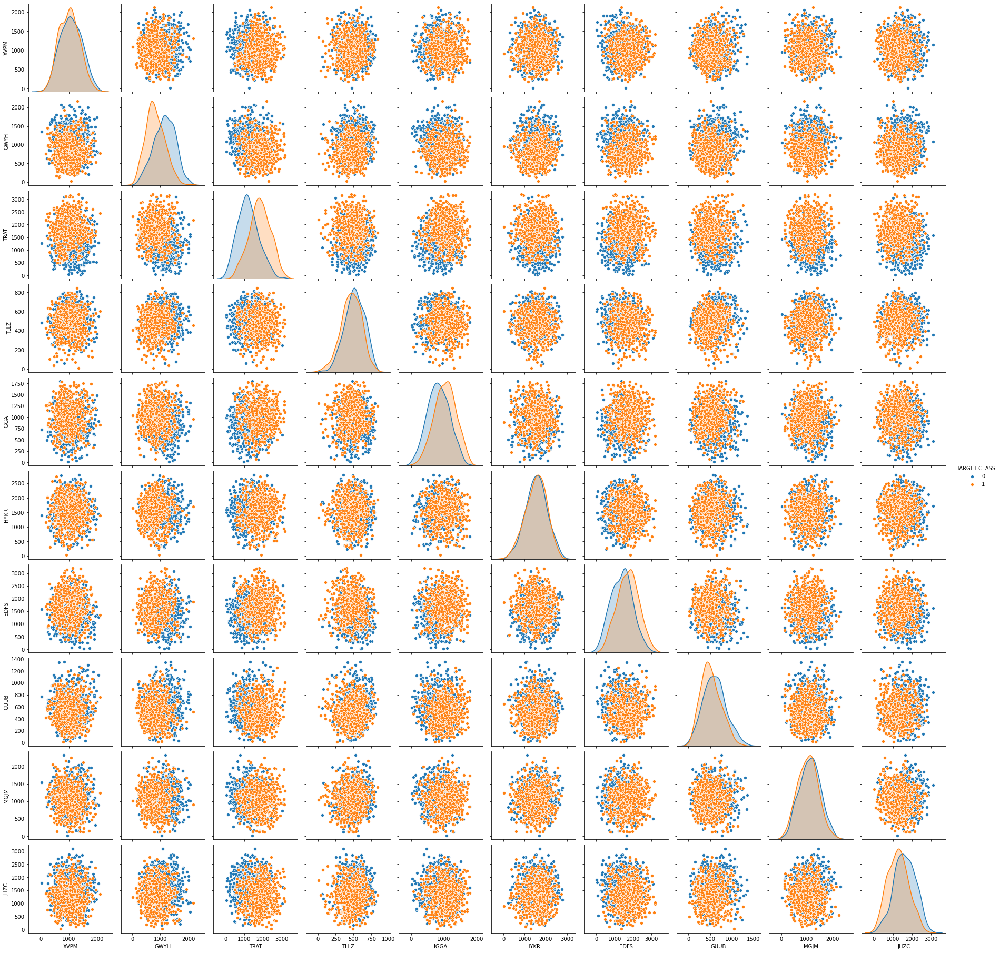

In [6]:
sns.pairplot(df,hue="TARGET CLASS")

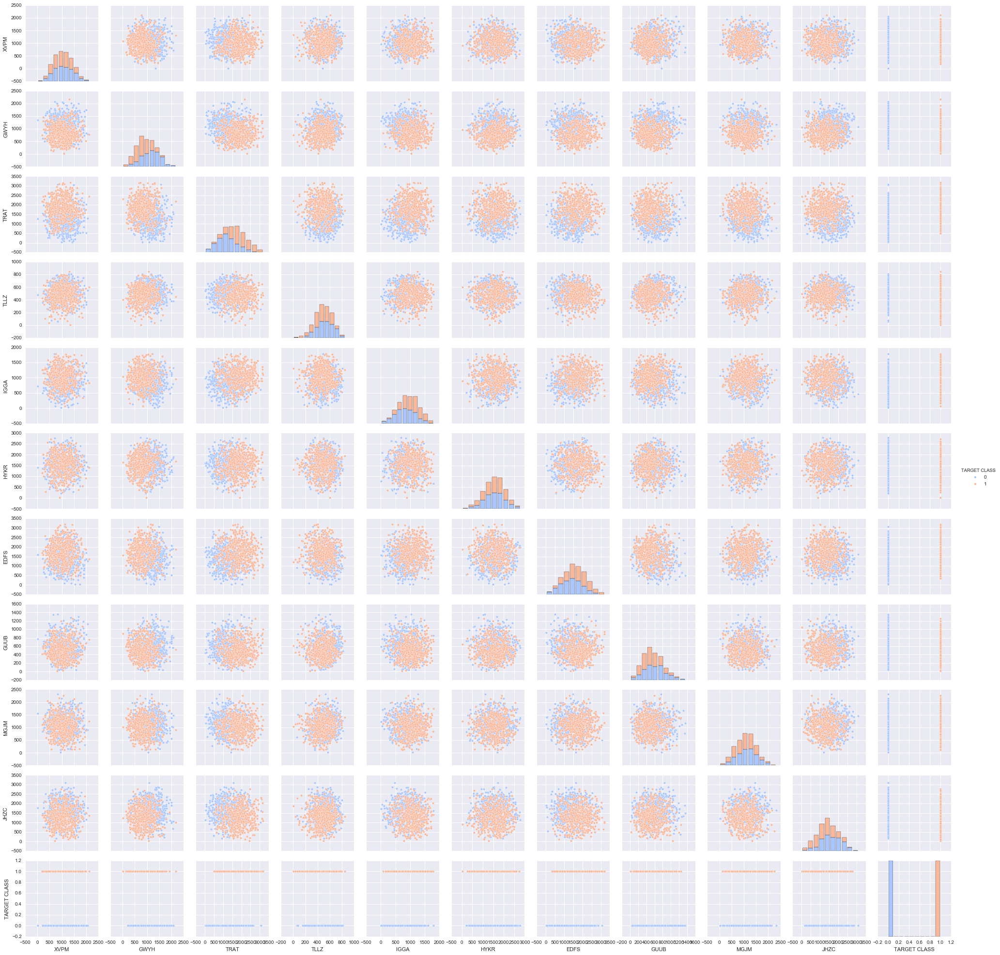

# Padronize as variáveis

Hora de para padronizar as variáveis.

** Import StandardScaler do Scikit-learn. **

In [7]:
from sklearn.preprocessing import StandardScaler

** Crie um objeto StandardScaler() chamado scaler. **

In [10]:
scaler= StandardScaler()

** Use o método fit() do objeto para treinar o modelo. **

In [12]:
scaler.fit(df.drop("TARGET CLASS",axis=1))

StandardScaler()

StandardScaler(copy=True, with_mean=True, with_std=True)

** Use o método .transform () para transformar os parâmetros em uma versão padronizada. **

In [13]:
df_p = scaler.transform(df.drop("TARGET CLASS",axis=1))

** Converta os parâmetros padronizados em um DataFrame e verifique o cabeçalho desse DataFrame para garantir que a transform() funcionou. **

In [14]:
df_param = pd.DataFrame(df_p,columns= df.columns[:-1])

In [16]:
df_param.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC
0,1.568522,-0.443435,1.619808,-0.958255,-1.128481,0.138336,0.980493,-0.932794,1.008313,-1.069627
1,-0.112376,-1.056574,1.741918,-1.504220,0.640009,1.081552,-1.182663,-0.461864,0.258321,-1.041546
2,0.660647,-0.436981,0.775793,0.213394,-0.053171,2.030872,-1.240707,1.149298,2.184784,0.342811
3,0.011533,0.191324,-1.433473,-0.100053,-1.507223,-1.753632,-1.183561,-0.888557,0.162310,-0.002793
4,-0.099059,0.820815,-0.904346,1.609015,-0.282065,-0.365099,-1.095644,0.391419,-1.365603,0.787762


,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC
0,1.568522,-0.443435,1.619808,-0.958255,-1.128481,0.138336,0.980493,-0.932794,1.008313,-1.069627
1,-0.112376,-1.056574,1.741918,-1.504220,0.640009,1.081552,-1.182663,-0.461864,0.258321,-1.041546
2,0.660647,-0.436981,0.775793,0.213394,-0.053171,2.030872,-1.240707,1.149298,2.184784,0.342811
3,0.011533,0.191324,-1.433473,-0.100053,-1.507223,-1.753632,-1.183561,-0.888557,0.162310,-0.002793
4,-0.099059,0.820815,-0.904346,1.609015,-0.282065,-0.365099,-1.095644,0.391419,-1.365603,0.787762


# Divisão treino-teste

** Use o método train_test_split para dividir seus dados em um conjunto treino e teste.**

In [27]:
x_test,x_train,y_test,y_train = train_test_split(df_param,df["TARGET CLASS"],test_size=0.3)

# Usando o KNN

** Importe o KNeighborClassifier do scikit learn. **

** Crie uma instância do modelo KNN com n_neighbors = 1 **

In [28]:
knn = KNeighborsClassifier(n_neighbors=1)

** Ajuste este modelo KNN aos dados de treinamento. **

In [29]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=1)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=1, p=2,
           weights='uniform')

# Previsões e avaliações
Vamos avaliar o nosso modelo KNN!

** Use o método de previsão para prever valores usando seu modelo KNN e X_test. **

In [30]:
predict = knn.predict(x_test)

** Crie uma matriz de confusão e um relatório de classificação. **

In [31]:
print(confusion_matrix(y_test,predict))

[[245 104]
 [ 84 267]]


[[112  40]
 [ 34 114]]


In [33]:
print(classification_report(y_test,predict))

precision    recall  f1-score   support

           0       0.74      0.70      0.72       349
           1       0.72      0.76      0.74       351

    accuracy                           0.73       700
   macro avg       0.73      0.73      0.73       700
weighted avg       0.73      0.73      0.73       700



             precision    recall  f1-score   support

          0       0.77      0.74      0.75       152
          1       0.74      0.77      0.75       148

avg / total       0.75      0.75      0.75       300



# Escolhendo o valor K
Vamos continuar usando o método do cotovelo para escolher um bom valor K!

** Crie um loop for que treine vários modelos KNN com valores k diferentes e, em seguida, mantenha um registro do error_rate para cada um desses modelos com uma lista. Consulte o notebook se você estiver confuso nesta etapa. **

In [36]:
error_rate = []
for i in range(1,40):

    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    predict = knn.predict(x_test)
    error_rate.append(np.mean(predict != y_test))

In [55]:
error_rate

[0.26857142857142857,
 0.2785714285714286,
 0.23285714285714285,
 0.20857142857142857,
 0.19714285714285715,
 0.2057142857142857,
 0.19285714285714287,
 0.21,
 0.21,
 0.19857142857142857,
 0.20285714285714285,
 0.19714285714285715,
 0.19428571428571428,
 0.19,
 0.19,
 0.19285714285714287,
 0.20142857142857143,
 0.18428571428571427,
 0.18857142857142858,
 0.19,
 0.18857142857142858,
 0.18714285714285714,
 0.19428571428571428,
 0.19285714285714287,
 0.19428571428571428,
 0.19142857142857142,
 0.19285714285714287,
 0.18714285714285714,
 0.19428571428571428,
 0.19428571428571428,
 0.19857142857142857,
 0.19,
 0.19285714285714287,
 0.19285714285714287,
 0.1957142857142857,
 0.19142857142857142,
 0.18714285714285714,
 0.18714285714285714,
 0.18857142857142858]

** Agora crie o seguinte gráfico usando as informações do seu loop. **

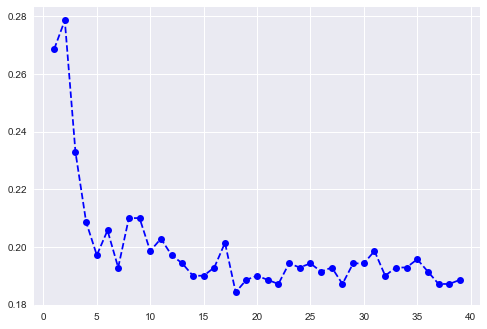

In [43]:
plt.style.use("seaborn")
plt.plot(range(1,40),error_rate,"b--",marker="o")

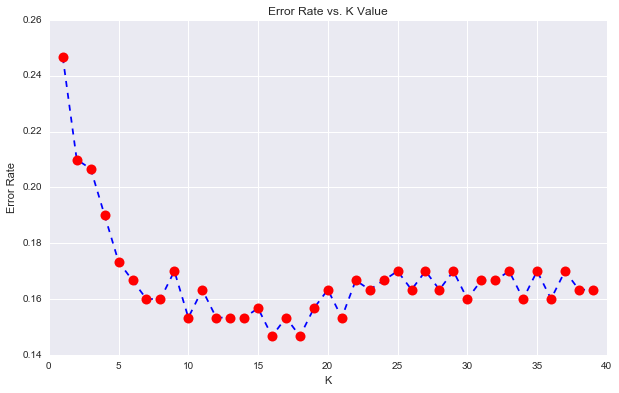

In [49]:
min_= error_rate[0]
iv = 0 
for i in range(0,39):
    if error_rate[i] < min_:
        min_= error_rate[i]
        iv = i+1
print(iv,":",min_)

18 : 0.18428571428571427


## Treine seu modelo novamente com novo valor K

** Treine novamente seu modelo com o melhor valor K (até você para decidir o que deseja) e re-faça o relatório de classificação e a matriz de confusão. **

In [58]:
knn1 = KNeighborsClassifier(n_neighbors=18)
knn1.fit(x_train,y_train)
predict1 = knn.predict(x_test)

print(confusion_matrix(y_test,predict1))
print(classification_report(y_test,predict1))

[[271  78]
 [ 63 288]]
              precision    recall  f1-score   support

           0       0.81      0.78      0.79       349
           1       0.79      0.82      0.80       351

    accuracy                           0.80       700
   macro avg       0.80      0.80      0.80       700
weighted avg       0.80      0.80      0.80       700



WITH K=30


[[127  25]
 [ 23 125]]


             precision    recall  f1-score   support

          0       0.85      0.84      0.84       152
          1       0.83      0.84      0.84       148

avg / total       0.84      0.84      0.84       300

